<h1 style="text-align: center;"><b>Generative adversarial network (GAN)</b></h1>


В этом блокноте мы имплеминтируем GAN, обучим его генерировать лица людей и посмотрим на то, как можно оценивать качество генерации.

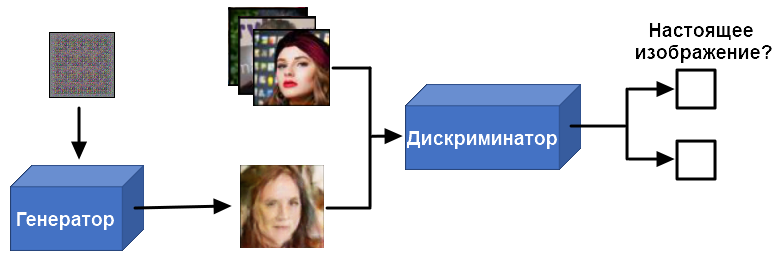



---
<a id='visual_distributions'></a>
## Содержание

- [⚒ Подготовка окружения](#environment)

- [📚 Подготовка данных](#data)

    - [💾 Загрузка данных](#download)

    - [🐘 Resize](#resize)

    - [⛓ Dataloader](#dataloader)

    - [⚡ CUDA](#cuda)

    - [🖼 Визуализация изображений](#visuaL)

- [⚙ Построение и обучение модели](#build_train)

    - [🕵 Дискриминатор](#discriminator)

    - [🆕 Генератор](#generator)

    - [⚓ Сохранение сгенерированных изображений](#save)

    - [🧠 Обучение модели](#train)

    - [🏃 Анимация процесса обучения](#animate)

- [✨ Генерация изображений](#image_generation)
    
- [📈 Leave-one-out-1-NN classifier accuracy](#1nn)

    - [📊 Подсчет accuracy](#accuracy)

    - [🎨 Визуализация распределений](#visual_distributions)
    




<a id='environment'></a>
## ⚒ Подготовка окружения
Импортируем необходимые библиотеки

In [1]:
import os
import pickle

from oauth2client.client import GoogleCredentials
from google.colab import auth
from pydrive.drive import GoogleDrive
from pydrive.auth import GoogleAuth
from google.colab import drive

import imageio
import random
from time import time
from IPython.display import clear_output
from tqdm.notebook import tqdm
from PIL import Image
import shutil

import numpy as np
import cv2

import torch
import torch.nn as nn
import torchvision.transforms as tt
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.utils import save_image
from torchvision.utils import make_grid

from sklearn.model_selection import LeaveOneOut
from sklearn.neighbors import KNeighborsClassifier
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

Вычисления будем проводить на GPU

In [2]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)

cuda


In [3]:
!nvidia-smi

Fri Jan 14 19:52:18 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8     9W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Далее будем сохранять модели на Google Диск

In [4]:
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [5]:
# Пути для сохранения
DATA_DIR = '/content/gdrive/MyDrive/gan/'
M_WEIGHTS = DATA_DIR + 'model_weights/'
M_LOGS = DATA_DIR + 'logs/'
FACES_DIR = DATA_DIR + 'faces/'
FACES = FACES_DIR + 'faces'

In [6]:
# Создаем каталоги и подкаталоги, если их не существует
os.makedirs(M_WEIGHTS, exist_ok=True)
os.makedirs(M_LOGS, exist_ok=True)
os.makedirs(FACES, exist_ok=True)

<a id='data'></a>
## 📚 Подготовка данных

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://drive.google.com/file/d/1KWPc4Pa7u2TWekUvNu9rTSO0U2eOlZA9/view?usp=sharing)

<a id='download'></a>
### 💾 Загрузка данных

In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

Скачаем архив с данными

In [ ]:
downloaded = drive.CreateFile({'id': '1KWPc4Pa7u2TWekUvNu9rTSO0U2eOlZA9'})
downloaded.GetContentFile('faces_dataset_small.zip')

Распакуем архив

In [ ]:
!unzip -q /content/faces_dataset_small.zip -d faces

In [ ]:
# Структура каталога
for address, dirs, files in os.walk('/content/faces'):
    print(address, dirs, len(files), sep='\n', end='\n\n')

/content/faces
['__MACOSX', 'faces_dataset_small']
0

/content/faces/__MACOSX
['faces_dataset_small']
1

/content/faces/__MACOSX/faces_dataset_small
['04000']
3145

/content/faces/__MACOSX/faces_dataset_small/04000
[]
1

/content/faces/faces_dataset_small
['04000']
3144

/content/faces/faces_dataset_small/04000
[]
1



In [ ]:
# Удалим лишние папки
shutil.rmtree('/content/faces/__MACOSX/')
shutil.rmtree('/content/faces/faces_dataset_small/04000/')

In [ ]:
# Структура каталога
for address, dirs, files in os.walk('/content/faces'):
    print(address, dirs, len(files), sep='\n', end='\n\n')

/content/faces
['faces_dataset_small']
0

/content/faces/faces_dataset_small
[]
3144



<a id='resize'></a>
### 🐘 Resize

В исходном датасете Flickr Faces картинки имеют разрешение (1024 х 1024). При таком разрешении GAN будет обучаться слишком долго. Изменим размер наших картинок и сохраним их

In [ ]:
image_size = 64

path = '/content/faces/faces_dataset_small/'

# Список с названиями файлов
_, _, files = next(iter(os.walk(path)))

# Количество преобразованных изображений
num_convert = 0

for file_name in files:
    if file_name.endswith(".png"):
        im = Image.open(os.path.join(path, file_name))
        rgb_im = im.convert('RGB')
        rgb_im = rgb_im.resize((image_size, image_size))
        rgb_im.save(os.path.join(FACES, file_name[:-4]+'.jpg'))
        num_convert += 1

print(f'{num_convert} изображений конвертированы в .jpg '
      f'и приведены к рамзеру {(image_size, image_size)}')

3143 изображений конвертированы в .jpg и приведены к рамзеру (64, 64)


<a id='dataloader'></a>
### ⛓ Dataloader

Напишем функцию, которая строит DataLoader для изображений

In [7]:
def get_dataloader(batch_size):
    """
    Построить Dataloader для тренировочных изображений.
    :param image_size: высота и ширина изображения
    :param batch_size: размер батча dataloader
    :returns: DataLoader object 
    """

    dataset = ImageFolder(root=FACES_DIR,
                          transform=tt.Compose([
                              # tt.Resize(image_size),
                              # tt.CenterCrop(image_size),
                              # tt.Normalize(
                              #     (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                              tt.ToTensor(),
                          ]))

    dataloader = DataLoader(
        dataset, batch_size, shuffle=True,
        num_workers=2, pin_memory=True, drop_last=True
    )

    return dataloader

Создадим dataloader

In [8]:
batch_size = 128

train_dl = get_dataloader(batch_size)
print('Размер Dataloader:', len(train_dl.dataset))

Размер Dataloader: 3143


<a id='cuda'></a>
### ⚡ CUDA
Напишем функцию для переноса на CUDA

In [9]:
def to_device(data, device):
    """Переместить тензор(ы) на device"""

    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]

    return data.to(device, non_blocking=True)


class DeviceDataLoader():
    """Обернуть dataloader для переноса данных на device"""

    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Выдать батч с данными после перемещения на device"""

        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Количество батчей"""

        return len(self.dl)

In [10]:
train_dl = DeviceDataLoader(train_dl, DEVICE)

<a id='visuaL'></a>
### 🖼 Визуализация изображений

In [11]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(
        images.detach().cpu()[:nmax], nrow=8).permute(1, 2, 0))

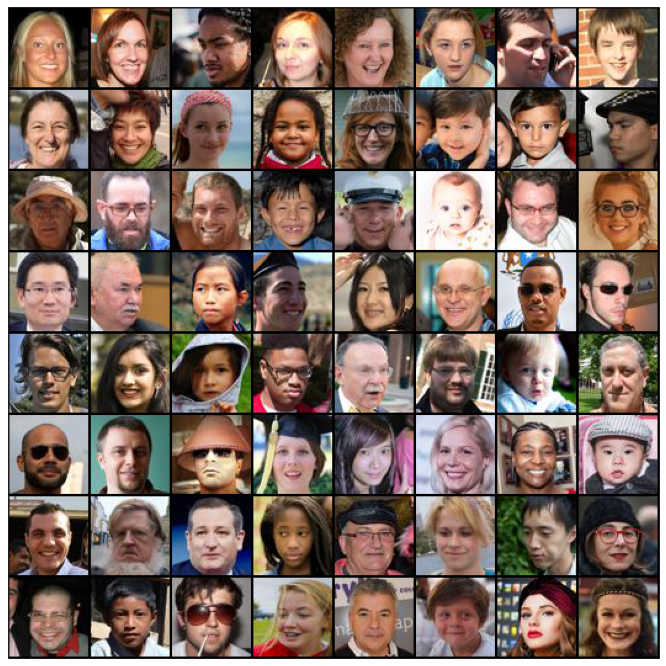

In [ ]:
show_images(next(iter(train_dl))[0])

<a id='build_train'></a>
## ⚙ Построение и обучение модели

Сконструируем генератор и дискриминатор:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

<a id='discriminator'></a>
### 🕵 Дискриминатор

In [12]:
discriminator = nn.Sequential(
    # input size: 3 x 64 x 64
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # # size: 64 x 32 x 32
    nn.Conv2d(64, 64 * 2, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64 * 2),
    nn.LeakyReLU(0.2, inplace=True),
    # size: 128 x 16 x 16
    nn.Conv2d(64*2, 64*4, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64 * 4),
    nn.LeakyReLU(0.2, inplace=True),
    # size: 256 x 8 x 8
    nn.Conv2d(64*4, 64*8, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64 * 8),
    nn.LeakyReLU(0.2, inplace=True),
    # size: 512 x 4 x 4
    nn.Conv2d(64 * 8, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # size: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

In [13]:
print(discriminator)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): LeakyReLU(negative_slope=0.2, inplace=True)
  (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): LeakyReLU(negative_slope=0.2, inplace=True)
  (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): LeakyReLU(negative_slope=0.2, inplace=True)
  (9): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): LeakyReLU(negative_slope=0.2, inplace=True)
  (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (13): Flatten(s

<a id='generator'></a>
### 🆕 Генератор

In [14]:
latent_size = 100

generator = nn.Sequential(
    # input size: latent_size x 1 x 1
    nn.ConvTranspose2d(latent_size, 64 * 8, kernel_size=4,
                       stride=1, padding=0, bias=False),
    nn.BatchNorm2d(64 * 8),
    nn.ReLU(True),
    # size: (64 * 8) x 4 x 4
    nn.ConvTranspose2d(64 * 8, 64 * 4, kernel_size=4,
                       stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64 * 4),
    nn.ReLU(True),
    # size: (64*4) x 8 x 8
    nn.ConvTranspose2d(64 * 4, 64 * 2, kernel_size=4,
                       stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64 * 2),
    nn.ReLU(True),
    # size: (64*2) x 16 x 16
    nn.ConvTranspose2d(64 * 2, 64, kernel_size=4,
                       stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # size: 64 x 32 x 32
    nn.ConvTranspose2d(64, 3, kernel_size=4,
                       stride=2, padding=1, bias=False),
    nn.Sigmoid()
    # size: 3 x 64 x 64
)

In [15]:
print(generator)

Sequential(
  (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU(inplace=True)
  (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU(inplace=True)
  (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (13): Sigmoid()
)


<a id='save'></a>
### ⚓ Сохранение сгенерированных изображений

In [16]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)

    if os.path.exists(os.path.join(M_LOGS, fake_fname)):
        os.remove(os.path.join(M_LOGS, fake_fname))

    save_image(fake_images, os.path.join(M_LOGS, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(16, 8))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(
            fake_images.detach().cpu(), nrow=8).permute(1, 2, 0))

<a id='train'></a>
### 🧠 Обучение модели

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь используем бинарную кросс-энтропию

In [17]:
def plot_gen_metrics(fake_images, dict_metrics, epoch):
    """Построение графиков и изображений в процессе обучения"""

    images = np.clip(fake_images[:8].permute(0, 2, 3, 1).numpy(), 0, 1)
    plt.figure(figsize=(15, 9))

    for i in range(8):
        plt.subplot(3, 8, i+1)
        plt.axis("off")
        plt.imshow(images[i])

    plt.subplot(3, 1, 2)
    plt.plot(dict_metrics['losses_d'], '-')
    plt.plot(dict_metrics['losses_g'], '-')
    plt.ylabel('loss')
    plt.legend(['Discriminator', 'Generator'])
    plt.title('Losses')

    plt.subplot(3, 1, 3)
    plt.plot(dict_metrics['real_scores'], '-')
    plt.plot(dict_metrics['fake_scores'], '-')
    plt.xlabel('epoch')
    plt.ylabel('score')
    plt.legend(['Real', 'Fake'])
    plt.title('Scores')

    plt.suptitle(f"epoch: {epoch + 1}"
                 f" | loss_generator: {dict_metrics['losses_g'][-1]:.4f}"
                 f" | loss_discriminator: {dict_metrics['losses_d'][-1]:.4f}",
                 fontsize=16)
    plt.tight_layout()
    plt.show()

Создадим батч латентных векторов, которые будем использовать для визуализации предсказаний генератора

In [18]:
fixed_noise = torch.randn(32, latent_size, 1, 1, device=DEVICE)

In [19]:
def fit(model, criterion, optimizer, scheduler, epochs, lr):
    """Training Loop"""

    since = time()
    torch.cuda.empty_cache()

    # Списки лоссов и скоров для отслеживания обучения
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Переводим модель в train режим
    model["discriminator"].train()
    model["generator"].train()

    # Иттерируемся по эпохам
    for epoch in range(epochs):
        # Списки с лоссами и скорами на данной эпохе
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []

        # Иттерируемся по батчам в даталоэдере
        for real_images, _ in tqdm(train_dl):

            #########################
            # Обучаем Discriminator #
            #########################
            # Обучаем на батче реальных картинок

            # Зануляем градиенты дискриминатора
            optimizer["discriminator"].zero_grad()

            # Пропускаем настоящие изображения через дискриминатор
            real_preds = model["discriminator"](real_images)
            b_size = real_images.size(0)  # Текущий размер батча
            # Метки для реальных картинок
            real_targets = torch.ones(b_size, 1, device=DEVICE)
            # "Сглаживаем" наши вероятности, отняв шумовые значения
            smooth = torch.rand(b_size, 1, device=DEVICE) / 40
            real_targets -= smooth
            # Считаем лосс и скор на настоящих картинках
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()

            # Обучаем на батче фейковых картинок
            # Генерируем батч латентных векторов
            latent = torch.randn(b_size, latent_size, 1, 1, device=DEVICE)
            # Генерируем батч фейковых изображений
            fake_images = model["generator"](latent)

            # Пропускаем фейковые изображения через дискриминатор
            fake_targets = torch.zeros(b_size, 1, device=DEVICE)
            # "Сглаживаем" наши вероятности, добавив шумовые значения
            smooth = torch.rand(b_size, 1, device=DEVICE) / 40
            fake_targets += smooth

            # Классифицируем батч фейковых картинок через дискриминатор
            fake_preds = model["discriminator"](fake_images)
            # Считаем лосс и скор на батче фейковых картинок
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Суммарный лосс на дискриминаторе
            loss_d = real_loss + fake_loss
            # Считаем градиенты для дискриминатора на данной эпохе
            loss_d.backward()
            # Обновляем веса дискриминатора
            optimizer["discriminator"].step()

            scheduler["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())

            #####################
            # Обучаем Generator #
            #####################

            # Зануляем градиенты генератора
            optimizer["generator"].zero_grad()

            # Генерируем батч латентных векторов
            latent = torch.randn(b_size, latent_size, 1, 1, device=DEVICE)
            # Генерируем фейковые изображения
            fake_images = model["generator"](latent)

            # Пытаемся обмануть дискриминатор
            preds = model["discriminator"](fake_images)
            targets = torch.ones(b_size, 1, device=DEVICE)
            loss_g = criterion["generator"](preds, targets)

            # Обновляем веса генератора
            loss_g.backward()
            optimizer["generator"].step()

            scheduler["generator"].step()
            loss_g_per_epoch.append(loss_g.item())

        # Запишем лоссы и скоры
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        # Логи loss'ов и scor'ов на последнем батче
        print(
            f"Epoch [{epoch+1}/{epochs}], loss_g: {losses_g[-1]}, "
            f"loss_d: {losses_d[-1]}, real_score: {real_scores[-1]}, "
            f"fake_score: {fake_scores[-1]}, time: {((time()-since)//60)} min"
        )

        # Сохраним model, картинки, лоссы и скоры
        dict_metrics = {
            'losses_g': losses_g,
            'losses_d': losses_d,
            'real_scores': real_scores,
            'fake_scores': fake_scores
        }

        # Сохраняем картинки каждую эпоху
        save_samples(epoch+1, fixed_noise, show=False)
        # Каждые 10 эпох сохраняем веса модели
        if (epoch + 1) % 10 == 0:
            torch.save(
                model['discriminator'].state_dict(),
                os.path.join(M_WEIGHTS, 'm_disc_epoch_' +
                             str(epoch+1) + '.pth')
            )
            torch.save(
                model['generator'].state_dict(),
                os.path.join(M_WEIGHTS, 'm_gen_epoch_' + str(epoch+1) + '.pth')
            )

            metrics_path = 'metrics_table_' + str(epoch+1) + '_epoch.pickle'
            with open(os.path.join(M_LOGS, metrics_path), 'wb') as f:
                pickle.dump(dict_metrics, f)

        # Visualize tools
        if (epoch + 1) % 5 == 0:
            clear_output(wait=True)
            plot_gen_metrics(fake_images.detach().cpu(), dict_metrics, epoch)

    # Итог
    print(
        f"Training is done! Epoch [{epoch+1}/{epochs}], loss_g: {losses_g[-1]},"
        f"loss_d: {losses_d[-1]}, real_score: {real_scores[-1]}, "
        f"fake_score: {fake_scores[-1]}, time: {((time()-since)//60)} min"
    )

    return model

Определим learning rate, модель, функцию потерь, оптимизатор и шедулер

In [20]:
lr = 0.0002

model = {
    "discriminator": discriminator.to(DEVICE),
    "generator": generator.to(DEVICE)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

optimizer = {
    "discriminator": torch.optim.Adam(model["discriminator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999)),
    "generator": torch.optim.Adam(model["generator"].parameters(),
                                  lr=lr, betas=(0.5, 0.999))
}

scheduler = {
    "discriminator": lr_scheduler.StepLR(optimizer["discriminator"],
                                         step_size=980, gamma=0.6),
    "generator": lr_scheduler.StepLR(optimizer["generator"],
                                     step_size=980, gamma=0.6)
}

Воспользуемся [рекомендацией](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) и инициализируем веса модели случайным образом из нормального распределения со средним значением = 0 и стандартным отклонением = 0.02

In [21]:
def weights_init(m):
    """Принимает инициализированную модель в качестве входных данных 
    и повторно инициализирует все convolutional, convolutional-transpose
    и batch normalization слои, чтобы они соответствовали распределению."""
     
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

Применим функцию weights_init к нашей модели

In [22]:
model["discriminator"].apply(weights_init)
model["generator"].apply(weights_init);

Построим графики лосса для генератора и дискриминатора

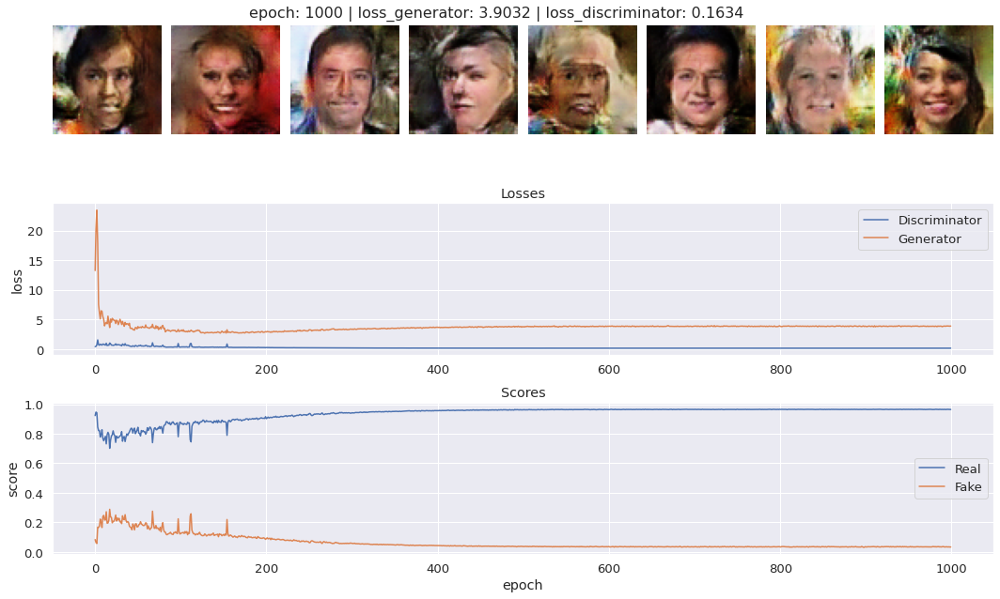

Training is done! Epoch [1000/1000], loss_g: 3.9032113750775657,loss_d: 0.16341582499444485, real_score: 0.9641299794117609, fake_score: 0.033783127553761005, time: 101.0 min


In [23]:
epochs = 1000
model = fit(model, criterion, optimizer, scheduler, epochs, lr)

Из графиков выше мы видим, что значения функций потерь и скоров вышли на постоянные значения и заметно не изменяются.

Кроме того, для зависимости скора видим характерное для GANов поведение. Изначально 'real' и 'fake' скоры близки к 1 и 0, соответственно, затем их значения приближаются к 0.5, и после расходятся обратно.

In [24]:
def show_gen(num_epoch):
    if (num_epoch <= 0) or (num_epoch > epochs):
        print(f'Количество эпох должно быть не меньше 1 и не больше {epochs}')

    else:
        fake_fname = 'generated-images-{0:0=4d}.png'.format(num_epoch)
        generated_img = cv2.imread(os.path.join(M_LOGS, fake_fname))
        generated_img = generated_img[:, :, [2, 1, 0]]

        fig, ax = plt.subplots(figsize=(16, 8))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(generated_img)
        plt.show()

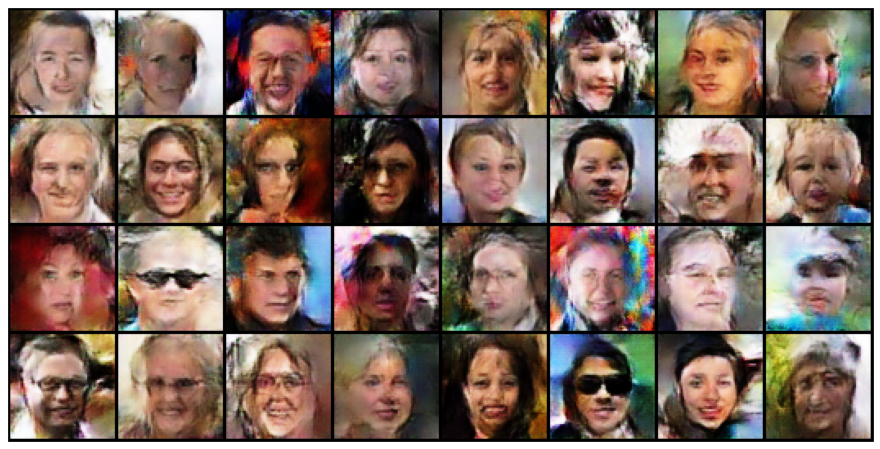

In [25]:
show_gen(epochs)

<a id='animate'></a>
### 🏃 Анимация процесса обучения

Создадим анимацию процесса обучения

In [ ]:
epochs = 1000
filenames = []

for epoch in range(epochs):
    filenames.append('generated-images-{0:0=4d}.png'.format(epoch+1))

In [ ]:
# Создадим gif
with imageio.get_writer('evolution.gif', mode='I') as writer:
    for name in filenames:
        image = imageio.imread(name)
        writer.append_data(image)

<a id='image_generation'></a>
## ✨ Генерация изображений

Теперь давайте оценим качество получившихся изображений. Напишем функцию, которая выводит изображения, сгенерированные нашим генератором

In [26]:
# Загрузим веса модели на 1000 эпохе
gen = generator.to(DEVICE)
gen.load_state_dict(torch.load(
    os.path.join(M_WEIGHTS, 'm_gen_epoch_1000.pth')))

<All keys matched successfully>

In [27]:
def show_gen_images(images):
    """Показать сгенерированные изображения"""

    fig, ax = plt.subplots(figsize=(16, 8))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images.detach().cpu(), nrow=8).permute(1, 2, 0))

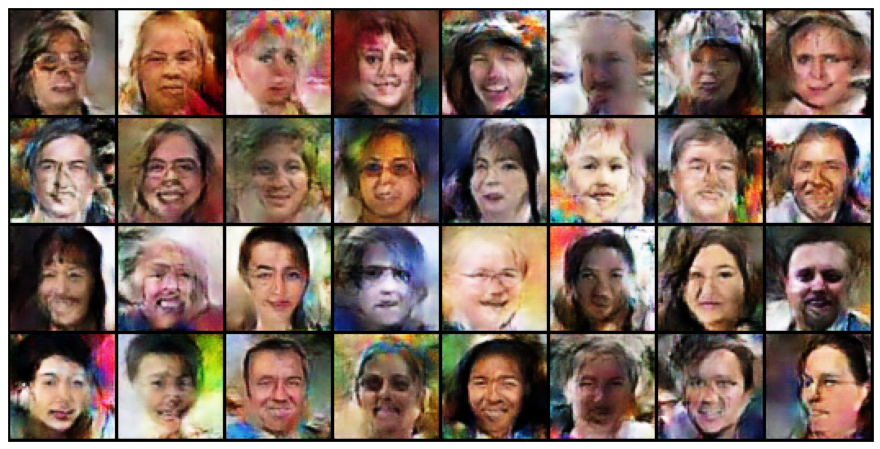

In [61]:
n_images = 32

fixed_noise = torch.randn(n_images, latent_size, 1, 1, device=DEVICE)
fake_images = gen(fixed_noise)

show_gen_images(fake_images)

Видим, что качество сгенерированных изображений отличается от картинки к картинке.

На основной части изображений присутствуют те или иные артефакты, которые сразу выдают, что эти лица были сгенерированны.

<a id='1nn'></a>
## 📈 Leave-one-out-1-NN classifier accuracy

<a id='accuracy'></a>
### 📊 Подсчет accuracy

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы реализуем следующий подход:
  * Сгенерируем столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоим фейковым метку класса 0, настоящим – 1.
  * Построим leave-one-out оценку: обучим 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверим качество (accuracy) на оставшемся объекте. В этом нам поможет `sklearn.model_selection.LeaveOneOut`

Получим векторы лиц из dataloader'а

In [29]:
x_real = torch.Tensor().to(DEVICE)

for images, _ in train_dl:
    x_real = torch.cat((x_real, images.view(images.size(0), -1)), dim=0)


x_real = x_real.detach().cpu()

# Количество изображений
num_images = x_real.shape[0]

# Метки класса
y_real = np.ones((num_images, 1))

In [30]:
# Запишем векторы в словарь
with open(os.path.join(M_LOGS, 'x_real.pickle'), 'wb') as f:
    pickle.dump(x_real, f)

In [31]:
# Получим столько же картинок, сгенерированных генератором
latent = torch.randn(num_images, latent_size, 1, 1, device=DEVICE)

with torch.no_grad():
    x_fake = gen(latent)

x_fake = x_fake.view(x_fake.size(0), -1).detach().cpu()

# Метки фейкового класса
y_fake = np.zeros_like(y_real)

In [32]:
# Запишем векторы в словарь
with open(os.path.join(M_LOGS, 'x_fake.pickle'), 'wb') as f:
    pickle.dump(x_fake, f)

In [33]:
# Загрузим тензоры реальных и фэйковых изображений
with open(os.path.join(M_LOGS, 'x_real.pickle'), 'rb') as f:
    x_real = pickle.load(f)

with open(os.path.join(M_LOGS, 'x_fake.pickle'), 'rb') as f:
    x_fake = pickle.load(f)

In [34]:
x_data = np.vstack((x_real, x_fake))
y_data = np.vstack((y_real, y_fake))

In [35]:
loo = LeaveOneOut()
loo.get_n_splits(x_data)

6144

In [36]:
accuracy = 0
num_iter = 0

for train_index, test_index in tqdm(loo.split(x_data)):
    one_neigh = KNeighborsClassifier(n_neighbors=1)

    X_train, X_test = x_data[train_index], x_data[test_index]
    y_train, y_test = y_data[train_index], y_data[test_index]

    one_neigh.fit(X_train, y_train.ravel())

    accuracy += (one_neigh.predict(X_test) == y_test)
    num_iter += 1

0it [00:00, ?it/s]

In [37]:
res_accuracy = accuracy[0, 0] / num_iter
print(f'Accuracy на {num_images} реальных и {num_images} фэйковых'
      f' изображениях:  {round(res_accuracy, 4)}')

Accuracy на 3072 реальных и 3072 фэйковых изображениях:  0.6525


В идеальном случае для нашего генератора мы бы получили значение accuracy = 0.5. Это бы означало, что наш классификатор (`KNeighborsClassifier`) не мог бы отличить сгенерированные картинки от настоящих, т.е. он с вероятностью 0.5 (случайным образом) предсказывал бы метку класса.

В случае же, если бы мы получили accuracy = 1, это бы означало, что 1-nn классификатор без каких-либо проблем отделяет фейковые изображения от настоящих. То есть генератор очень плохо справился со своей задачей.

В противоположной ситуации, при accuracy = 0, мы бы получили "плохой" классификатор, который с легкостью отличает сгенерированные изображения от настоящих, но при этом путает их метки. В этом случае достаточно было бы просто инвертировать предсказания такого классификатора. Генератор же в этом случае тоже плохо справился со своей задачей.

Видим, что accuracy для нашего GAN'а получилось 0.65. Что является неплохим результатом.

<a id='visual_distributions'></a>
### 🎨 Визуализация распределений

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуемся методом, снижающим размерность (к примеру, TSNE), и изобразим на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [38]:
# Загрузим тензоры реальных и фэйковых изображений
with open(os.path.join(M_LOGS, 'x_real.pickle'), 'rb') as f:
    x_real = pickle.load(f)

with open(os.path.join(M_LOGS, 'x_fake.pickle'), 'rb') as f:
    x_fake = pickle.load(f)

In [39]:
# Количество изображений
num_images = x_real.shape[0]

In [40]:
# Для TSNE слеим их и переведем в numpy
# real_images = real_images[:1000, :]
x_data = torch.cat((x_real, x_fake), dim=0).numpy()
x_data.shape

(6144, 12288)

In [41]:
# Уменьшим размерность изображений
x_tsne = TSNE(n_components=2, random_state=1, n_jobs=-1).fit_transform(x_data)
x_tsne.shape

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(6144, 2)

In [42]:
# Сохраним латентные представления
with open(os.path.join(M_LOGS, 'x_tsne.pickle'), 'wb') as f:
    pickle.dump(x_tsne, f)

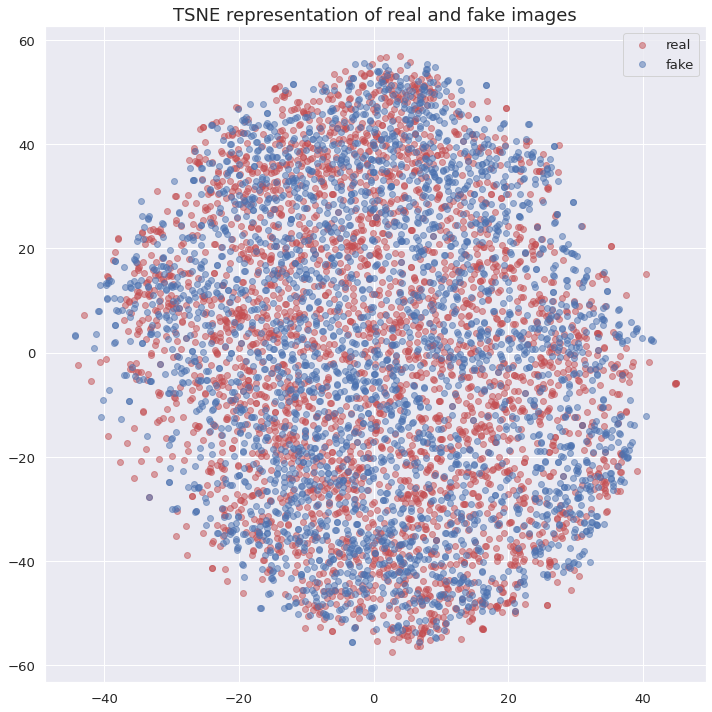

In [43]:
# Отрисуем точки, соответствующие реальным и сгенерированным изображениям
plt.figure(figsize=(10, 10))

plt.scatter(x_tsne[:num_images, 0],
            x_tsne[:num_images, 1],
            c='r',
            alpha=0.5,
            label='real'
            )
plt.scatter(x_tsne[num_images:, 0],
            x_tsne[num_images:, 1],
            c='b',
            alpha=0.5,
            label='fake'
            )

plt.title('TSNE representation of real and fake images', fontsize=18)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

Видим, что точки реальных и сгенерированных изображений после отображения на плоскость неплохо перемешаны. Кроме того, на взгляд, они линейно неразделимы.